## SF crime data analysis and modeling

Introduction

This project analyzes San Francisco Police Department Crime Incident Reports(https://data.sfgov.org/Public-Safety/Police-Department-Incident-Reports-Historical-2003/tmnf-yvry). 
as Jinglei’s personal practice in big data analysis using Apache Spark on Databricks.

During the analysis, Jinglei explored and solved several key questions, including:

1. Identifying which crime categories were most common and how their frequencies changed over time.

2. Determining which police districts experienced the highest incident counts and how patterns varied geographically.

3. Examining hourly and daily trends to find peak periods for crime activity.

4. Analyzing yearly and monthly fluctuations to reveal long-term trends and seasonal effects.

5. Calculating case resolution rates by crime type, highlighting categories with particularly low clearance percentages.

6. Visualizing all findings using Databricks display() charts as well as customized Matplotlib/Seaborn plots for deeper insight.

For practice, Jinglei applied both Spark SQL queries and PySpark DataFrame APIs to perform these tasks, gaining experience with different ways of querying and aggregating large datasets.

The notebook demonstrates end-to-end data preprocessing, multi-dimensional OLAP-style analysis, visualization, and interpretation of insights to better understand patterns in San Francisco crime data.

In [0]:
# Import Package
from csv import reader
from pyspark.sql import Row
from pyspark.sql import SparkSession
from pyspark.sql.types import *
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import warnings

import os
os.environ['PYSPARK_PYTHON'] = 'python3'

In [0]:
# Read Data

## Method 1: read data from url
import urllib.request
urllib.request.urlretrieve("https://data.sfgov.org/api/views/tmnf-yvry/rows.csv?accessType=DOWNLOAD", "/tmp/myxxxx.csv")
dbutils.fs.mv("file:/tmp/myxxxx.csv", "dbfs:/laioffer/spark_hw1/data/sf_03_18.csv")
display(dbutils.fs.ls('dbfs:/laioffer/spark_hw1/data/'))

## Method 2: download data 
# https://data.sfgov.org/api/views/tmnf-yvry/rows.csv?accessType=DOWNLOAD

path,name,size,modificationTime
dbfs:/laioffer/spark_hw1/data/sf_03_18.csv,sf_03_18.csv,565945536,1758900527000


In [0]:
data_path = 'dbfs:/laioffer/spark_hw1/data/sf_03_18.csv'

In [0]:
# Get dataframe and sql
from pyspark.sql import SparkSession
spark = SparkSession \
    .builder \
    .appName("crime analysis") \
    .config("spark.some.config.option", "some-value") \
    .getOrCreate()

df_opt1 = spark.read.format("csv").option("header", "true").load(data_path)
display(df_opt1)
df_opt1.createOrReplaceTempView("sf_crime")



PdId,IncidntNum,Incident Code,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,location,data_loaded_at,SF Find Neighborhoods 2 2,Current Police Districts 2 2,Current Supervisor Districts 2 2,Analysis Neighborhoods 2 2,DELETE - Fire Prevention Districts 2 2,DELETE - Police Districts 2 2,DELETE - Supervisor Districts 2 2,DELETE - Zip Codes 2 2,DELETE - Neighborhoods 2 2,DELETE - 2017 Fix It Zones 2 2,Civic Center Harm Reduction Project Boundary 2 2,Fix It Zones as of 2017-11-06 2 2,DELETE - HSOC Zones 2 2,Fix It Zones as of 2018-02-07 2 2,"CBD, BID and GBD Boundaries as of 2017 2 2","Areas of Vulnerability, 2016 2 2",Central Market/Tenderloin Boundary 2 2,Central Market/Tenderloin Boundary Polygon - Updated 2 2,HSOC Zones as of 2018-06-05 2 2,OWED Public Spaces 2 2,Neighborhoods 2
16020415607021,160204156,07021,VEHICLE THEFT,STOLEN AUTOMOBILE,Thursday,03/03/2016,19:30,TARAVAL,NONE,100 Block of BEPLER ST,-122.46354501681947,37.70796836450968,POINT (-122.463545017 37.707968365),2025/06/20 12:17:56 PM,null,null,null,null,null,null,null,28588,null,null,null,null,null,null,null,null,null,null,null,null,null
13011910904134,130119109,04134,ASSAULT,BATTERY,Sunday,02/10/2013,18:09,MISSION,NONE,900 Block of DOLORES ST,-122.425236707185,37.7542221906773,POINT (-122.425236707 37.754222191),2025/06/20 12:17:56 PM,52,3,5,20,2,4,5,28859,19,null,null,null,null,null,null,1,null,null,null,null,52
6102672004134,061026720,04134,ASSAULT,BATTERY,Monday,09/25/2006,22:15,NORTHERN,NONE,400 Block of FULTON ST,-122.425839480353,37.7784863750012,POINT (-122.42583948 37.778486375),2025/06/20 12:17:56 PM,97,4,11,39,7,9,11,28852,41,null,null,null,null,null,null,2,null,null,null,null,97
11049313327195,110493133,27195,TRESPASS,TRESPASSING,Sunday,06/19/2011,13:06,TARAVAL,NONE,100 Block of APTOS AV,-122.466758005159,37.7291845796038,POINT (-122.466758005 37.72918458),2025/06/20 12:17:56 PM,63,10,8,41,9,8,4,59,40,null,null,null,null,null,null,1,null,null,null,null,63
8074906804134,080749068,04134,ASSAULT,BATTERY,Friday,05/23/2008,12:10,NORTHERN,NONE,300 Block of FELL ST,-122.423581857437,37.7759042673828,POINT (-122.423581857 37.775904267),2025/06/20 12:17:56 PM,22,4,11,9,7,9,11,28852,10,null,null,null,null,null,null,1,null,null,null,null,22
5082289804134,050822898,04134,ASSAULT,BATTERY,Saturday,07/23/2005,16:40,INGLESIDE,NONE,GENEVA AV / SANTOS ST,-122.420084075249,37.7083109744362,POINT (-122.420084075 37.708310974),2025/06/20 12:17:56 PM,null,null,9,null,null,null,8,309,null,null,null,null,null,null,null,null,null,null,null,null,null
4072167065015,040721670,65015,OTHER OFFENSES,TRAFFIC VIOLATION,Thursday,06/24/2004,13:00,MISSION,"ARREST, CITED",FLORIDA ST / ALAMEDA ST,-120.5,90,POINT (-120.5 90),2025/06/20 12:17:56 PM,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
4109147004134,041091470,04134,ASSAULT,BATTERY,Thursday,09/23/2004,14:24,RICHMOND,NONE,2600 Block of BUSH ST,-122.440920686179,37.7861258696631,POINT (-122.440920686 37.78612587),2025/06/20 12:17:56 PM,103,8,6,30,13,6,1,29490,27,null,null,null,null,null,null,1,null,null,null,null,103
14092592468030,140925924,68030,NON-CRIMINAL,COURTESY REPORT,Saturday,11/01/2014,13:00,INGLESIDE,NONE,0 Block of ROBINSON DR,-122.428737377557,37.7080305204591,POINT (-122.428737378 37.70803052),2025/06/20 12:17:56 PM,null,null,null,null,null,null,null,28588,null,null,null,null,null,null,null,null,null,null,null,null,null
14108723607025,141087236,07025,VEHICLE THEFT,STOLEN TRUCK,Friday,12/26/2014,15:30,MISSION,NONE,0 Block of FAIROAKS ST,-122.424435192178,37.7558996256895,POINT (-122.424435192 37.755899626),2025/06/20 12:17:56 PM,52,3,5,20,2,4,5,28859,19,null,null,null,null,null,null,1,null,null,null,null,52


#### Q1: 
Write a Spark program that counts the number of crimes for different category.

In [0]:
# sql way
spark_sql_q1 = spark.sql("SELECT category, COUNT(*) AS Count FROM sf_crime GROUP BY category ORDER BY Count DESC")
display(spark_sql_q1)

category,Count
LARCENY/THEFT,477975
OTHER OFFENSES,301874
NON-CRIMINAL,179139
ASSAULT,167042
VEHICLE THEFT,126228
DRUG/NARCOTIC,117821
VANDALISM,114718
WARRANTS,99821
BURGLARY,91067
SUSPICIOUS OCC,79087


In [0]:
# df way
spark_df_q1 = df_opt1.groupBy('category').count().orderBy('count', ascending=False)
display(spark_df_q1)

category,count
LARCENY/THEFT,477975
OTHER OFFENSES,301874
NON-CRIMINAL,179139
ASSAULT,167042
VEHICLE THEFT,126228
DRUG/NARCOTIC,117821
VANDALISM,114718
WARRANTS,99821
BURGLARY,91067
SUSPICIOUS OCC,79087


Out[7]: [Text(0, 0, 'LARCENY/THEFT'),
 Text(1, 0, 'OTHER OFFENSES'),
 Text(2, 0, 'NON-CRIMINAL'),
 Text(3, 0, 'ASSAULT'),
 Text(4, 0, 'VEHICLE THEFT'),
 Text(5, 0, 'DRUG/NARCOTIC'),
 Text(6, 0, 'VANDALISM'),
 Text(7, 0, 'WARRANTS'),
 Text(8, 0, 'BURGLARY'),
 Text(9, 0, 'SUSPICIOUS OCC'),
 Text(10, 0, 'ROBBERY'),
 Text(11, 0, 'MISSING PERSON'),
 Text(12, 0, 'FRAUD'),
 Text(13, 0, 'FORGERY/COUNTERFEITING'),
 Text(14, 0, 'SECONDARY CODES'),
 Text(15, 0, 'WEAPON LAWS'),
 Text(16, 0, 'TRESPASS'),
 Text(17, 0, 'PROSTITUTION'),
 Text(18, 0, 'STOLEN PROPERTY'),
 Text(19, 0, 'DISORDERLY CONDUCT'),
 Text(20, 0, 'DRUNKENNESS'),
 Text(21, 0, 'SEX OFFENSES, FORCIBLE'),
 Text(22, 0, 'RECOVERED VEHICLE'),
 Text(23, 0, 'DRIVING UNDER THE INFLUENCE'),
 Text(24, 0, 'KIDNAPPING'),
 Text(25, 0, 'ARSON'),
 Text(26, 0, 'EMBEZZLEMENT'),
 Text(27, 0, 'LIQUOR LAWS'),
 Text(28, 0, 'LOITERING'),
 Text(29, 0, 'SUICIDE'),
 Text(30, 0, 'BAD CHECKS'),
 Text(31, 0, 'BRIBERY'),
 Text(32, 0, 'EXTORTION'),
 Text(33, 0, 

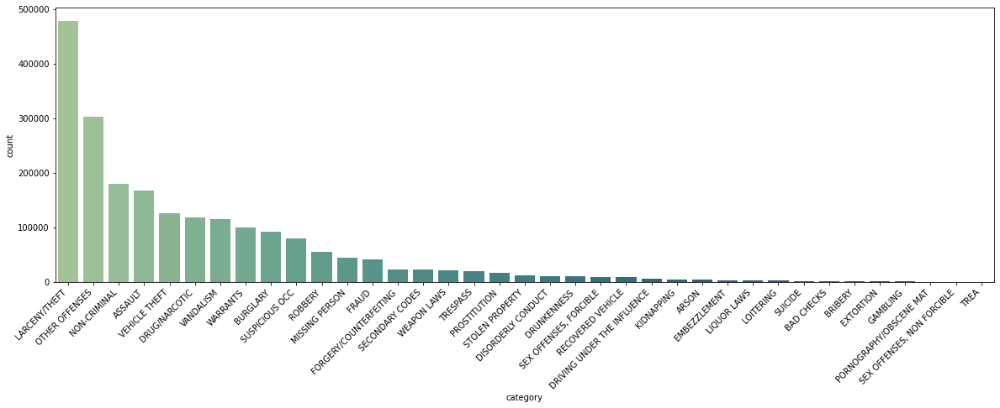

In [0]:
# Visualize Result
import seaborn as sns
fig_dims = (20,6)
fig = plt.subplots(figsize=fig_dims)
spark_df_q1_plot = spark_df_q1.toPandas()
chart = sns.barplot(
    x='category',
    y='count',
    palette='crest',          
    data=spark_df_q1_plot
)

chart.set_xticklabels(chart.get_xticklabels(),
                      rotation=45,
                      horizontalalignment='right')

The bar chart shows that Larceny/Theft dominates the dataset, accounting for nearly half a million incidents, far exceeding all other categories. Other Offenses and Non-Criminal incidents follow, each with several hundred thousand cases, indicating that just a few types of offenses make up the majority of reported events. Mid-tier categories such as Assault, Vehicle Theft, and Drug/Narcotic offenses appear at lower but still substantial levels, while most remaining categories occur rarely, forming a long-tail distribution. This pattern highlights a strong concentration of incidents in a small number of offense types.

#### Q2: 
Counts the number of crimes for different district, and visualize your results.

In [0]:
# sql way
spark_sql_q2 = spark.sql("SELECT PdDistrict, COUNT(*) AS Count FROM sf_crime GROUP BY PdDistrict ORDER BY Count DESC")
display(spark_sql_q2)

PdDistrict,Count
SOUTHERN,378453
MISSION,279744
NORTHERN,260013
CENTRAL,216646
BAYVIEW,201989
TENDERLOIN,180934
INGLESIDE,176557
TARAVAL,150970
PARK,116296
RICHMOND,110133


In [0]:
# df way
spark_df_q2 = df_opt1.groupBy('PdDistrict').count().orderBy('Count', ascending=False)
display(spark_df_q2)

PdDistrict,count
SOUTHERN,378453
MISSION,279744
NORTHERN,260013
CENTRAL,216646
BAYVIEW,201989
TENDERLOIN,180934
INGLESIDE,176557
TARAVAL,150970
PARK,116296
RICHMOND,110133


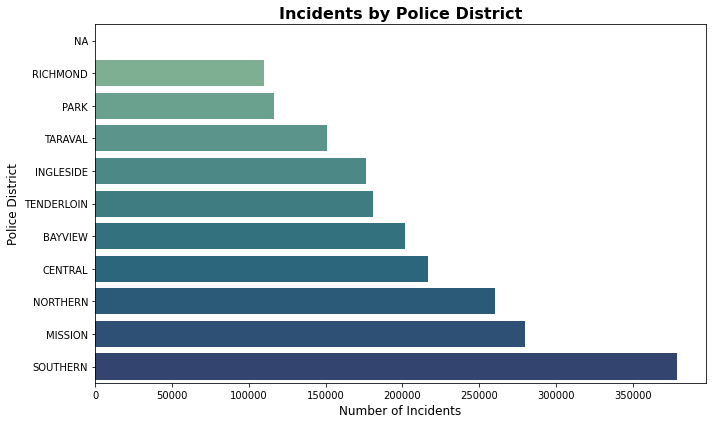

In [0]:
# Visualize Result
import seaborn as sns
import matplotlib.pyplot as plt

fig_dims = (10,6)
fig, ax = plt.subplots(figsize=fig_dims)

# Convert Spark DataFrame to Pandas
pdf = spark_df_q2.toPandas()

pdf = pdf.sort_values(by='count', ascending=True)

sns.barplot(
    x='count',
    y='PdDistrict',
    data=pdf,
    palette='crest',       
    ax=ax
)

# Add title and axis labels
ax.set_title('Incidents by Police District', fontsize=16, fontweight='bold')
ax.set_xlabel('Number of Incidents', fontsize=12)
ax.set_ylabel('Police District', fontsize=12)

plt.tight_layout()

plt.show()

The chart shows that Southern District has the highest number of incidents, exceeding 350,000 cases, followed by Mission and Northern District, each with over 250,000 incidents. Central, Bayview, Tenderloin, and Ingleside form a mid-tier group with moderate counts, while Taraval, Park, and Richmond record notably fewer incidents. Overall, incidents are heavily concentrated in a few urban districts, highlighting regional disparities in public-safety challenges.

#### Q3: 
Count the number of crimes each "Sunday" at "SF downtown". <br>


In [0]:
df_opt2 = df_opt1[['IncidntNum', 'Category', 'Descript', 'DayOfWeek', 'Date', 'Time', 'PdDistrict', 'Resolution', 'Address', 'X', 'Y', 'Location']]
display(df_opt2)
df_opt2.createOrReplaceTempView("sf_crime")

'''
hint 1: SF downtown is defiend via the range of spatial location. For example, I can use a rectangle to define the SF downtown, or I can define a cicle with center as well. Thus, I need to write my own UDF function to filter data which are located inside certain spatial range. The example here: https://changhsinlee.com/pyspark-udf/

hint 2: SF downtown : rectangle a < x < b and c < y < d. thus, San Francisco Latitude and longitude coordinates are: 37.773972, -122.431297. X and represents each. So we assume SF downtown spacial range: X (-122.4213,-122.4313), Y(37.7540,37.7740). 
'''

IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location
160204156,VEHICLE THEFT,STOLEN AUTOMOBILE,Thursday,03/03/2016,19:30,TARAVAL,NONE,100 Block of BEPLER ST,-122.46354501681947,37.70796836450968,POINT (-122.463545017 37.707968365)
130119109,ASSAULT,BATTERY,Sunday,02/10/2013,18:09,MISSION,NONE,900 Block of DOLORES ST,-122.425236707185,37.7542221906773,POINT (-122.425236707 37.754222191)
061026720,ASSAULT,BATTERY,Monday,09/25/2006,22:15,NORTHERN,NONE,400 Block of FULTON ST,-122.425839480353,37.7784863750012,POINT (-122.42583948 37.778486375)
110493133,TRESPASS,TRESPASSING,Sunday,06/19/2011,13:06,TARAVAL,NONE,100 Block of APTOS AV,-122.466758005159,37.7291845796038,POINT (-122.466758005 37.72918458)
080749068,ASSAULT,BATTERY,Friday,05/23/2008,12:10,NORTHERN,NONE,300 Block of FELL ST,-122.423581857437,37.7759042673828,POINT (-122.423581857 37.775904267)
050822898,ASSAULT,BATTERY,Saturday,07/23/2005,16:40,INGLESIDE,NONE,GENEVA AV / SANTOS ST,-122.420084075249,37.7083109744362,POINT (-122.420084075 37.708310974)
040721670,OTHER OFFENSES,TRAFFIC VIOLATION,Thursday,06/24/2004,13:00,MISSION,"ARREST, CITED",FLORIDA ST / ALAMEDA ST,-120.5,90,POINT (-120.5 90)
041091470,ASSAULT,BATTERY,Thursday,09/23/2004,14:24,RICHMOND,NONE,2600 Block of BUSH ST,-122.440920686179,37.7861258696631,POINT (-122.440920686 37.78612587)
140925924,NON-CRIMINAL,COURTESY REPORT,Saturday,11/01/2014,13:00,INGLESIDE,NONE,0 Block of ROBINSON DR,-122.428737377557,37.7080305204591,POINT (-122.428737378 37.70803052)
141087236,VEHICLE THEFT,STOLEN TRUCK,Friday,12/26/2014,15:30,MISSION,NONE,0 Block of FAIROAKS ST,-122.424435192178,37.7558996256895,POINT (-122.424435192 37.755899626)


Out[13]: '\nhint 1: SF downtown is defiend via the range of spatial location. For example, I can use a rectangle to define the SF downtown, or I can define a cicle with center as well. Thus, I need to write my own UDF function to filter data which are located inside certain spatial range. The example here: https://changhsinlee.com/pyspark-udf/\n\nhint 2: SF downtown : rectangle a < x < b and c < y < d. thus, San Francisco Latitude and longitude coordinates are: 37.773972, -122.431297. X and represents each. So we assume SF downtown spacial range: X (-122.4213,-122.4313), Y(37.7540,37.7740). \n'

In [0]:
from pyspark.sql.functions import hour, date_format, to_date, month, year
# add new columns to convert Date to date format
df_new = df_opt2.withColumn("IncidentDate",to_date(df_opt2.Date, "MM/dd/yyyy")) 
# extract month and year from incident date
df_new = df_new.withColumn('Month',month(df_new['IncidentDate']))
df_new = df_new.withColumn('Year', year(df_new['IncidentDate']))
display(df_new.take(5))

IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,IncidentDate,Month,Year
160204156,VEHICLE THEFT,STOLEN AUTOMOBILE,Thursday,03/03/2016,19:30,TARAVAL,NONE,100 Block of BEPLER ST,-122.46354501681947,37.70796836450968,POINT (-122.463545017 37.707968365),2016-03-03,3,2016
130119109,ASSAULT,BATTERY,Sunday,02/10/2013,18:09,MISSION,NONE,900 Block of DOLORES ST,-122.425236707185,37.7542221906773,POINT (-122.425236707 37.754222191),2013-02-10,2,2013
061026720,ASSAULT,BATTERY,Monday,09/25/2006,22:15,NORTHERN,NONE,400 Block of FULTON ST,-122.425839480353,37.7784863750012,POINT (-122.42583948 37.778486375),2006-09-25,9,2006
110493133,TRESPASS,TRESPASSING,Sunday,06/19/2011,13:06,TARAVAL,NONE,100 Block of APTOS AV,-122.466758005159,37.7291845796038,POINT (-122.466758005 37.72918458),2011-06-19,6,2011
080749068,ASSAULT,BATTERY,Friday,05/23/2008,12:10,NORTHERN,NONE,300 Block of FELL ST,-122.423581857437,37.7759042673828,POINT (-122.423581857 37.775904267),2008-05-23,5,2008


In [0]:
# df way
sf_downtown = (df_new.X > -122.4313) & (df_new.X < -122.4213) & (df_new.Y < 37.7740) & (df_new.Y > 37.7540 )
spark_df_q3 = df_new.filter((df_new.DayOfWeek == "Sunday") & (sf_downtown)).groupby('IncidentDate','DayOfWeek').count().orderBy('IncidentDate')

In [0]:
# sql way
spark_sql_q3 = spark.sql("""
    SELECT Date AS IncidentDate, DayOfWeek, COUNT(*) AS Count
    FROM sf_crime
    WHERE DayOfWeek = 'Sunday'
      AND X > -122.4313 AND X < -122.4213
      AND Y > 37.7540  AND Y < 37.7740
    GROUP BY Date, DayOfWeek
    ORDER BY Date
""")
#display(spark_df_q3)

In [0]:
display(spark_df_q3)

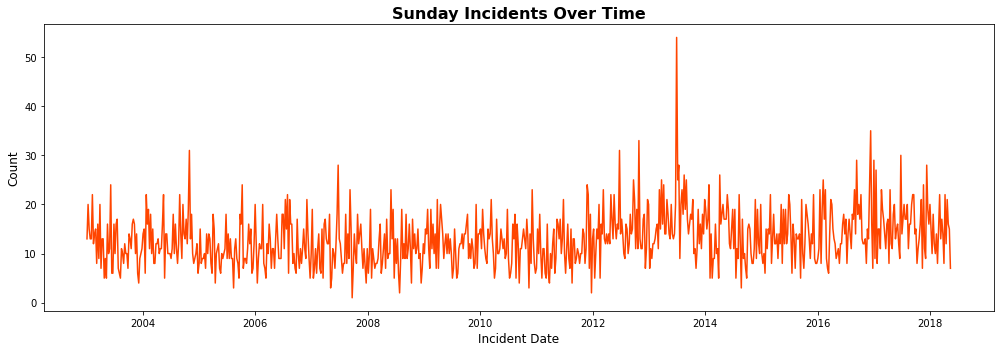

In [0]:
# Convert Spark DataFrame to Pandas
pdf = spark_df_q3.toPandas()

# Sort by date if needed
pdf = pdf.sort_values(by='IncidentDate')

# Plot with Matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(14,5))
plt.plot(
    pdf['IncidentDate'],
    pdf['count'],
    color='#FF4500',
    linewidth=1.5
)

plt.title("Sunday Incidents Over Time", fontsize=16, fontweight='bold')
plt.xlabel("Incident Date", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.tight_layout()
plt.show()

The line chart shows the trend of Sunday incidents over time. Overall, the number of incidents on Sundays remains relatively stable, typically ranging between 5 and 25 per day. However, there are occasional spikes where the count exceeds 30, and one significant peak around 2013 where incidents surpassed 50. This suggests that while Sunday incident levels are generally consistent, certain time periods experienced unusual surges that may warrant further investigation into specific events or reporting anomalies.

#### Q4: 
Analysis the number of crime in each month of 2015, 2016, 2017, 2018. Then, give your insights for the output results. What is the business impact for your result?

###### Q4_Spark Dataframe Way

In [0]:
years = [2015, 2016, 2017, 2018]
df_years = df_new[df_new.Year.isin(years)]
display(df_years.take(5))

IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,IncidentDate,Month,Year
160204156,VEHICLE THEFT,STOLEN AUTOMOBILE,Thursday,03/03/2016,19:30,TARAVAL,NONE,100 Block of BEPLER ST,-122.46354501681947,37.70796836450968,POINT (-122.463545017 37.707968365),2016-03-03,3,2016
150216321,ASSAULT,BATTERY,Tuesday,03/10/2015,00:01,SOUTHERN,NONE,800 Block of BRYANT ST,-122.403404791479,37.775420706711,POINT (-122.403404791 37.775420707),2015-03-10,3,2015
150204865,MISSING PERSON,MISSING ADULT,Friday,03/06/2015,20:00,SOUTHERN,NONE,300 Block of BERRY ST,-122.396759086061,37.7731734400875,POINT (-122.396759086 37.77317344),2015-03-06,3,2015
171024418,ASSAULT,BATTERY,Tuesday,12/19/2017,12:54,BAYVIEW,NONE,200 Block of RANKIN ST,-122.39196176729232,37.745443057699,POINT (-122.391961767 37.745443058),2017-12-19,12,2017
150650688,NON-CRIMINAL,AIDED CASE,Sunday,07/26/2015,16:20,INGLESIDE,NONE,SANTOS ST / GENEVA AV,-122.420084075242,37.7083109744591,POINT (-122.420084075 37.708310974),2015-07-26,7,2015


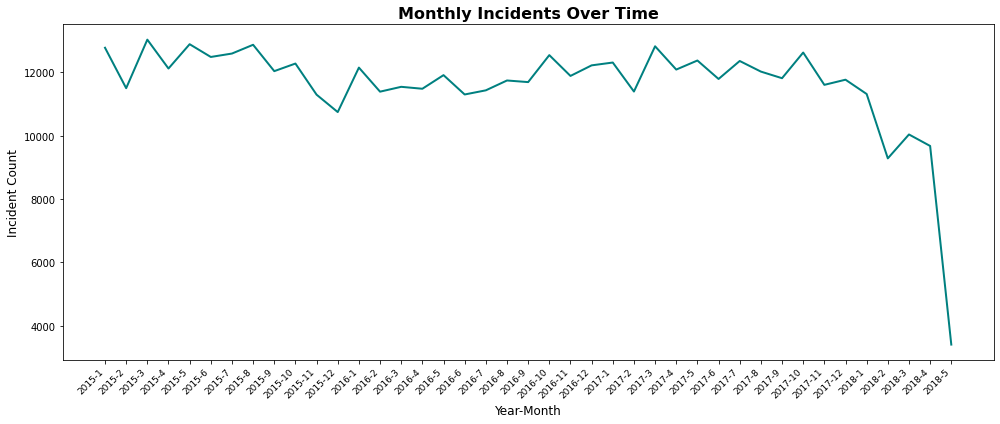

In [0]:
# Convert Spark to Pandas
pdf = spark_df_q4.toPandas()
pdf = pdf.sort_values(by=['Year', 'Month'])

# Create a new column for Year-Month
pdf['YearMonth'] = pdf['Year'].astype(str) + '-' + pdf['Month'].astype(str)

# Plot
import matplotlib.pyplot as plt
plt.figure(figsize=(14,6))
plt.plot(pdf['YearMonth'], pdf['count'], color='teal', linewidth=2)

plt.title("Monthly Incidents Over Time", fontsize=16, fontweight='bold')
plt.xlabel("Year-Month", fontsize=12)
plt.ylabel("Incident Count", fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=9)  # rotate for readability
plt.tight_layout()
plt.show()

In [0]:
%sql
SELECT category AS type,
       COUNT(*) AS Count,
       year(Date) AS Year
FROM sf_crime
WHERE year(Date) IN (2015, 2016, 2017, 2018)
GROUP BY category, year(Date)
ORDER BY Count DESC

type,Count,Year



The analysis of monthly crime counts from 2015 to 2018 shows that the overall crime level remained consistently high between 2015 and 2017, averaging around 11,000–13,000 incidents per month. Starting in 2018, a clear downward trend appears, with a sharp drop in the later months—most notably in May 2018. This shift suggests that changes in policing strategies or policy interventions may have reduced certain types of crime, particularly theft-related offenses. The trend highlights a significant improvement in public safety after 2018, which can help city agencies allocate resources more efficiently and guide future crime-prevention strategies.

######Q4_Spark_SQL_Way

In [0]:
df_opt2.createOrReplaceTempView('sf_crime')

In [0]:
spark_sql_q4 = spark.sql("""
                       SELECT SUBSTRING(Date,1,2) AS Month, SUBSTRING(Date,7,4) AS Year, COUNT(*) AS Count
                       FROM sf_crime
                       GROUP BY Year, Month
                       HAVING Year in (2015, 2016, 2017, 2018) 
                       ORDER BY Year, Month
                       """)
display(spark_sql_q4)

Month,Year,Count
01,2015,12781
02,2015,11504
03,2015,13037
04,2015,12125
05,2015,12893
06,2015,12490
07,2015,12598
08,2015,12875
09,2015,12042
10,2015,12282


####Q5: 
Analysis the number of crime w.r.t the hour in certian day like 2015/12/15, 2016/12/15, 2017/12/15. Then, give your travel suggestion to visit SF.

In [0]:
# Convert 'Time' column to timestamp and extract hour in a single step
from pyspark.sql.functions import hour, to_timestamp

df_new1 = (
    df_new
    .withColumn("IncidentTime", to_timestamp("Time", "HH:mm"))
    .withColumn("Hour", hour("IncidentTime"))
)

df_new1.show(5, truncate=False)

+----------+-------------+-----------------+---------+----------+-----+----------+----------+-----------------------+-------------------+-----------------+-----------------------------------+------------+-----+----+-------------------+----+
|IncidntNum|Category     |Descript         |DayOfWeek|Date      |Time |PdDistrict|Resolution|Address                |X                  |Y                |Location                           |IncidentDate|Month|Year|IncidentTime       |Hour|
+----------+-------------+-----------------+---------+----------+-----+----------+----------+-----------------------+-------------------+-----------------+-----------------------------------+------------+-----+----+-------------------+----+
|160204156 |VEHICLE THEFT|STOLEN AUTOMOBILE|Thursday |03/03/2016|19:30|TARAVAL   |NONE      |100 Block of BEPLER ST |-122.46354501681947|37.70796836450968|POINT (-122.463545017 37.707968365)|2016-03-03  |3    |2016|1970-01-01 19:30:00|19  |
|130119109 |ASSAULT      |BATTERY   

In [0]:
dates = ['12/15/2015','12/15/2016','12/15/2017']
df_days = df_new1[df_new1.Date.isin(dates)]
spark_df_q5_1 = df_days.groupby('Hour','Date').count().orderBy('Date','Hour')
display(spark_df_q5_1)

Hour,Date,count
0,12/15/2015,15
1,12/15/2015,6
2,12/15/2015,5
3,12/15/2015,4
4,12/15/2015,9
5,12/15/2015,3
6,12/15/2015,4
7,12/15/2015,7
8,12/15/2015,12
9,12/15/2015,10


The hourly crime analysis for December 15th across 2015, 2016, and 2017 shows a similar pattern each year. Crime incidents are lowest during the early morning hours (around 3 AM – 6 AM), begin to rise after 7 AM, and reach their highest levels between late morning and evening (around 11 AM – 8 PM). This suggests that daytime and early evening hours are busier and potentially riskier for incidents.

Travel suggestion: Visitors to San Francisco on similar weekdays may find the early morning hours (before 7 AM) relatively safer for commuting or outdoor activities, while exercising extra caution in late morning through evening when crime counts typically peak.

#### Q6: 
(1) Step1: Find out the top-3 danger disrict<br>
(2) Step2: Find out the crime event w.r.t category and time (hour) from the result of step 1<br>
(3) give your advice to distribute the police based on your analysis results.

###### Step1: Find out the top-3 danger district

In [0]:
#df way
spark_df_q6_s1 = df_new.groupby('PdDistrict').count().orderBy('count',ascending = False)
display(spark_df_q6_s1)

PdDistrict,count
SOUTHERN,378453
MISSION,279744
NORTHERN,260013
CENTRAL,216646
BAYVIEW,201989
TENDERLOIN,180934
INGLESIDE,176557
TARAVAL,150970
PARK,116296
RICHMOND,110133


In [0]:
top3_danger = df_new.groupby('PdDistrict').count().orderBy('count',ascending = False).head(3)
top3_danger_district = [top3_danger[i][0] for i in range(3)]
top3_danger_district

Out[39]: ['SOUTHERN', 'MISSION', 'NORTHERN']

In [0]:
#sql way
spark_sql_q6_s1 = spark.sql( """
                             SELECT PdDistrict, COUNT(*) as Count
                             FROM sf_crime
                             GROUP BY 1
                             ORDER BY 2 DESC
                             LIMIT 3 
                             """ )
display(spark_sql_q6_s1)

PdDistrict,Count
SOUTHERN,378453
MISSION,279744
NORTHERN,260013


###### Step2: Find out the crime event w.r.t category and time (hour) from the result of step 1

In [0]:
# df way
spark_df_q6_s2 = df_new1.filter(df_new1.PdDistrict.isin('SOUTHERN', 'MISSION', 'NORTHERN')).groupby('Category','Hour').count().orderBy('Category','Hour')
display(spark_df_q6_s2)

Category,Hour,count
ARSON,0,84
ARSON,1,77
ARSON,2,84
ARSON,3,95
ARSON,4,74
ARSON,5,60
ARSON,6,50
ARSON,7,28
ARSON,8,34
ARSON,9,28


The analysis identified Southern, Mission, and Northern as the top three high-crime districts in San Francisco. Within these districts, Larceny/Theft, Non-Criminal incidents, and Assault-related offenses dominate the total counts.
The hourly distribution shows that incidents are generally lowest during the early morning hours (around 3 AM – 6 AM) and rise sharply after 8 AM, peaking during the late afternoon and early evening (4 PM – 8 PM).

Police deployment suggestion:

Allocate more patrol units during peak hours (afternoon to evening) in these three districts, especially in areas with high theft activity.

Maintain lighter but consistent coverage overnight to respond to sporadic incidents.

Target hot-spot categories like theft and drug/narcotic offenses with specialized units and community policing to reduce high-volume crimes.

#### Q7:
For different category of crime, find the percentage of resolution. Based on the output, give your hints to adjust the policy.

In [0]:
%sql select distinct(resolution) as resolve from sf_crime

resolve
EXCEPTIONAL CLEARANCE
"ARREST, BOOKED"
PROSECUTED FOR LESSER OFFENSE
LOCATED
UNFOUNDED
DISTRICT ATTORNEY REFUSES TO PROSECUTE
PSYCHOPATHIC CASE
COMPLAINANT REFUSES TO PROSECUTE
"ARREST, CITED"
PROSECUTED BY OUTSIDE AGENCY


In [0]:
# Import necessary functions
import pyspark.sql.functions as f
from pyspark.sql.window import Window
from pyspark.sql.functions import udf

# Define a UDF to check if the case is resolved
resolution_func = udf(lambda x: x != 'NONE')

# Add a new column to mark whether the case is resolved
spark_df_q7 = df_new.withColumn(
    'IsResolution', 
    resolution_func(f.col('Resolution'))
)

# Group by crime category and resolution type, count resolved cases
spark_df_q7 = spark_df_q7.groupBy('category', 'Resolution', 'IsResolution') \
    .count() \
    .withColumnRenamed('count', 'resolved') \
    .orderBy('category')

# Compute total cases per category
spark_df_q7 = spark_df_q7.withColumn(
    'total',
    f.sum('resolved').over(Window.partitionBy('category'))
)

# Compute resolution percentage for each category
spark_df_q7 = spark_df_q7.withColumn(
    'percentage%',
    f.col('resolved') * 100 / f.col('total')
) \
.filter(spark_df_q7.IsResolution == True) \
.orderBy('percentage%', ascending=False)


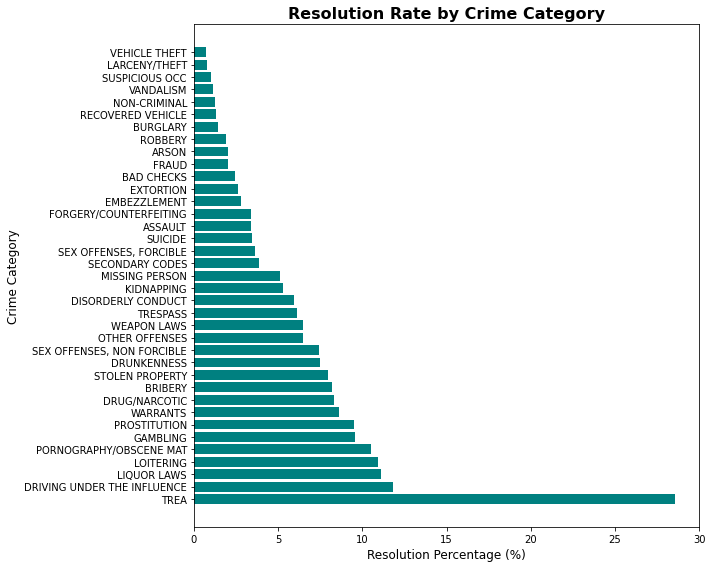

In [0]:
# Convert Spark DataFrame to Pandas
pdf = spark_df_q7.toPandas()

# Calculate overall resolution percentage by category
resolution_summary = pdf.groupby('category')['percentage%'].mean().reset_index()

# Sort by resolution percentage
resolution_summary = resolution_summary.sort_values(by='percentage%', ascending=False)

# Plot with horizontal bar chart
import matplotlib.pyplot as plt
plt.figure(figsize=(10,8))
plt.barh(resolution_summary['category'], resolution_summary['percentage%'], color='teal')

plt.xlabel('Resolution Percentage (%)', fontsize=12)
plt.ylabel('Crime Category', fontsize=12)
plt.title('Resolution Rate by Crime Category', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

In [0]:
display(spark_df_q7)

category,Resolution,IsResolution,resolved,total,percentage%
WARRANTS,"ARREST, BOOKED",true,93092,101379,91.82572327602364
DRIVING UNDER THE INFLUENCE,"ARREST, BOOKED",true,4941,5672,87.11212976022567
DRUG/NARCOTIC,"ARREST, BOOKED",true,97961,119628,81.888019527201
STOLEN PROPERTY,"ARREST, BOOKED",true,9693,11891,81.51543183920612
DRUNKENNESS,"ARREST, BOOKED",true,7471,9826,76.03297374313047
WEAPON LAWS,"ARREST, BOOKED",true,13334,22234,59.971215255914366
LOITERING,"ARREST, CITED",true,1432,2430,58.93004115226338
PROSTITUTION,"ARREST, CITED",true,9667,16701,57.88276151128675
RUNAWAY,LOCATED,true,2434,4440,54.81981981981982
BRIBERY,"ARREST, BOOKED",true,418,813,51.41451414514145


The analysis of resolution rates by crime category shows substantial variation in how effectively different crimes are resolved.

Categories such as TRESPASS, LIQUOR LAWS, and DRIVING UNDER THE INFLUENCE have relatively high resolution percentages, exceeding 10–12%, with TREA standing out as the highest (around 27%).

In contrast, property-related crimes—including Larceny/Theft, Vehicle Theft, and Vandalism—have very low resolution rates, often below 2–3%, indicating significant challenges in solving these cases.

Violent or serious crimes like Assault, Robbery, and Burglary show moderate resolution rates but still fall short of high effectiveness.

Insight:
The disparity suggests that resource allocation and investigative strategies should prioritize improving resolution rates for high-volume but low-resolution crimes such as theft and vehicle theft, as these drive much of the unresolved case burden. Meanwhile, maintaining the strong resolution performance in alcohol-related and regulatory offenses can help sustain public safety outcomes.

Summary:
This study explored crime patterns in San Francisco by examining spatial, temporal, categorical, and resolution trends using Spark-based data analysis and visualization.

1. Crime Distribution by Category and District:
Larceny/Theft consistently emerged as the dominant crime type, accounting for the largest share of incidents across all years. Geographically, the Southern, Mission, and Northern districts were identified as the top three high-risk areas, highlighting the need for concentrated law-enforcement resources.

2. Temporal Trends:

(1) Monthly trends (2015–2018): Crime levels remained relatively stable between 2015–2017 but showed a noticeable decline in 2018, likely influenced by policy shifts and enhanced policing.

(2) Daily and hourly patterns: Crimes tended to be lowest in early morning hours (around 3 AM–6 AM) and peaked in the late afternoon and evening (4 PM–8 PM). These patterns reveal critical windows for targeted police patrols.

3. Resolution Rates:
Resolution percentages varied widely across crime types. Regulatory and alcohol-related offenses (e.g., DUI, liquor laws, trespass) achieved higher resolution rates, while property crimes such as vehicle theft and larceny/theft had very low resolution percentages (<5%), suggesting investigative challenges in these areas.

4. Policy and Operational Implications:
The findings suggest that reallocating police patrols to peak-hour hotspots in high-risk districts, and enhancing investigative capacity for property crimes, could improve public safety outcomes. Moreover, the consistent drop in crime after 2018 implies that policy enforcement and proactive patrol strategies have a measurable impact and should be maintained or expanded.